In [1]:
import pandas as pd
import numpy as np

from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error

from datetime import timedelta, datetime
#import holidays

import matplotlib
import pickle
import seaborn as sns

import plotly.express as px
import matplotlib.pyplot as plt
import plotly.graph_objs as go

matplotlib.pyplot.style.use('ggplot')
%matplotlib inline

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
pd.set_option('display.float_format', lambda x: '%.6f' % x)
pd.set_option('display.width', 500)

In [2]:
df_poor = pd.read_csv('../../../data/train_economic_class/df_poor.csv')

In [3]:
df_poor.shape

(24602, 29)

In [4]:
df_poor['target_class'] = np.where(round(df_poor['log_TARGET'], 1) <= -29.9, 1, 0) # class 1 means TARGET is 0.0 

In [5]:
df_poor_reg = df_poor[df_poor['target_class'] == 0]

In [6]:
df_poor_reg.shape

(9070, 30)

In [7]:
df_poor_reg.info()

<class 'pandas.core.frame.DataFrame'>
Index: 9070 entries, 1 to 24601
Data columns (total 30 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   ID                      9070 non-null   int64  
 1   TARGET                  9070 non-null   float64
 2   open_year               9070 non-null   int64  
 3   open_month              9070 non-null   int64  
 4   first_prediction        9070 non-null   float64
 5   log_first_prediction    9070 non-null   float64
 6   economic_class          9070 non-null   object 
 7   log_TARGET              9070 non-null   float64
 8   Retention_count_D0_3    9070 non-null   int64  
 9   Retention_count_D4_7    9070 non-null   int64  
 10  Retention_count_D8_11   9070 non-null   int64  
 11  Retention_count_D12_15  9070 non-null   int64  
 12  Avg_Lvl_Count_D0_3      9070 non-null   float64
 13  Avg_Lvl_Count_D4_7      9070 non-null   float64
 14  Avg_Lvl_Count_D8_11     9070 non-null   floa

In [8]:
df_poor_reg.describe()

,ID,TARGET,open_year,open_month,first_prediction,log_first_prediction,log_TARGET,Retention_count_D0_3,Retention_count_D4_7,Retention_count_D8_11,Retention_count_D12_15,Avg_Lvl_Count_D0_3,Avg_Lvl_Count_D4_7,Avg_Lvl_Count_D8_11,Avg_Lvl_Count_D12_15,Avg_Duration_Lvl0_3,Avg_Duration_Lvl4_7,Avg_Duration_Lvl8_10,Total_AdRevenueD0_3,Total_AdRevenueD4_7,Total_AdRevenueD8_11,Total_AdRevenueD12_15,Total_IAPRevenueD0_3,Total_IAPRevenueD4_7,Total_IAPRevenueD8_11,Total_IAPRevenueD12_15,Total_AdRevenue,Total_IAPRevenue,target_class
count,9070.000000,9070.000000,9070.000000,9070.000000,9070.000000,9070.000000,9070.000000,9070.000000,9070.000000,9070.000000,9070.000000,9070.000000,9070.000000,9070.000000,9070.000000,9070.000000,9070.000000,9070.000000,9070.000000,9070.000000,9070.000000,9070.000000,9070.000000,9070.000000,9070.000000,9070.000000,9070.000000,9070.000000,9070.000000
mean,441674.166703,0.076253,2024.000000,3.222051,0.631381,-0.573046,-4.650173,2.682690,1.781367,1.536935,1.436384,10.555954,6.356698,5.076847,4.554107,102.964057,178.220535,150.206983,0.019694,0.012539,0.009715,0.008552,0.000286,0.000000,0.000000,0.000000,0.050499,0.000286,0.000000
std,253859.011629,0.374056,0.000000,1.508925,0.215660,0.626305,2.344845,1.119834,1.461961,1.442970,1.426278,13.976802,11.651569,10.550864,9.881766,130.352921,158.176526,158.429748,0.056188,0.037510,0.031559,0.030964,0.021517,0.000000,0.000000,0.000000,0.122860,0.021517,0.000000
min,15.000000,0.000000,2024.000000,1.000000,0.000429,-7.754010,-15.857464,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,221639.500000,0.002525,2024.000000,2.000000,0.500000,-0.693147,-5.981495,2.000000,0.000000,0.000000,0.000000,2.500000,0.000000,0.000000,0.000000,48.666667,99.500000,81.666667,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.002409,0.000000,0.000000
50%,439904.000000,0.010850,2024.000000,3.000000,0.651711,-0.428155,-4.523616,3.000000,2.000000,1.000000,1.000000,5.250000,1.750000,0.750000,0.500000,77.333333,148.250000,125.333333,0.005062,0.001210,0.000009,0.000000,0.000000,0.000000,0.000000,0.000000,0.014787,0.000000,0.000000
75%,662688.000000,0.046184,2024.000000,5.000000,0.801566,-0.221187,-3.075126,4.000000,3.000000,3.000000,3.000000,13.000000,7.500000,5.437500,4.500000,122.666667,219.500000,189.333333,0.019881,0.011225,0.007299,0.006030,0.000000,0.000000,0.000000,0.000000,0.051483,0.000000,0.000000
max,878565.000000,21.396171,2024.000000,5.000000,0.950985,-0.050257,3.063212,4.000000,4.000000,4.000000,4.000000,163.750000,152.000000,147.500000,179.500000,7277.666667,5738.000000,6503.666667,2.096290,1.063774,0.968628,1.158346,1.943500,0.000000,0.000000,0.000000,3.362672,1.943500,0.000000


In [9]:
X_cols = [col for col in df_poor_reg.columns if col not in ['ID', 'open_year', 'open_month', 'economic_class', 'target_class',
                                                           'first_prediction', 'TARGET']]

In [10]:
df_poor_reg.log_TARGET.describe()

count   9070.000000
mean      -4.650173
std        2.344845
min      -15.857464
25%       -5.981495
50%       -4.523616
75%       -3.075126
max        3.063212
Name: log_TARGET, dtype: float64

<Axes: >

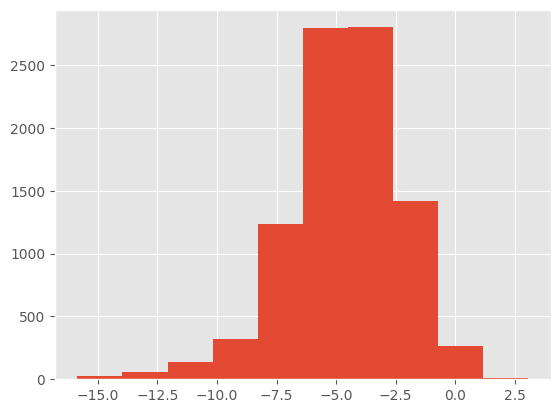

In [12]:
df_poor_reg.log_TARGET.hist()

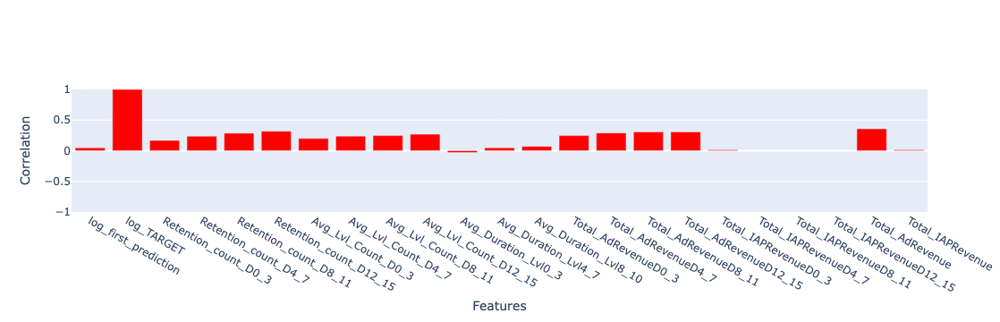

In [13]:
target_corr = df_poor_reg[X_cols].corr()['log_TARGET']

fig = go.Figure([go.Bar(y = target_corr, x = target_corr.index, marker_color = 'red')])

fig.update_layout(xaxis_title = "Features", yaxis_title = "Correlation",
    yaxis = dict(
        range=(-1, 1),
        showticklabels=True
    ))
fig.show()

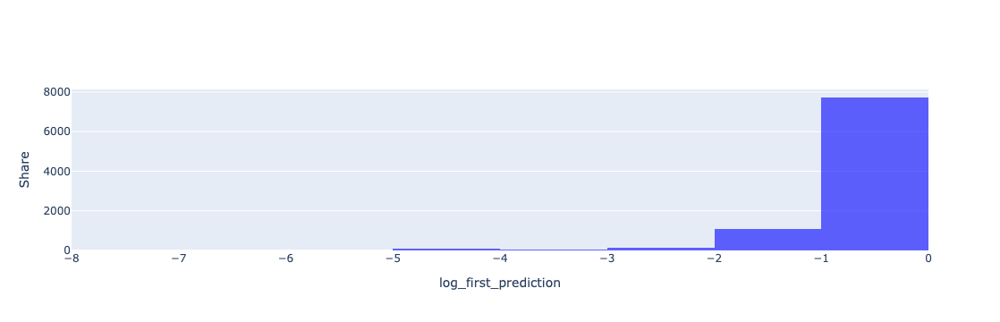

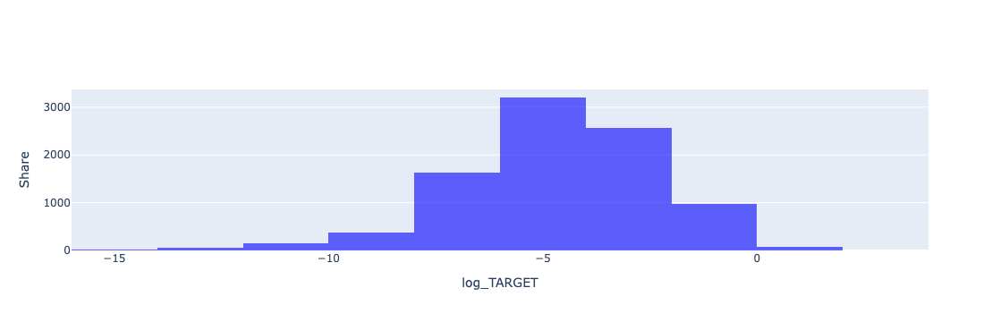

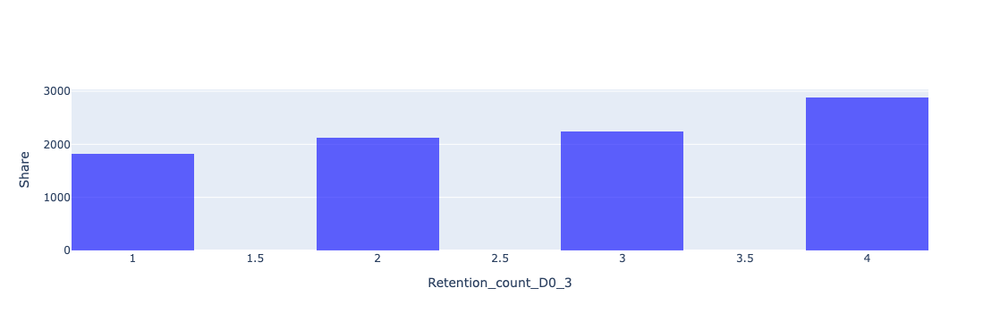

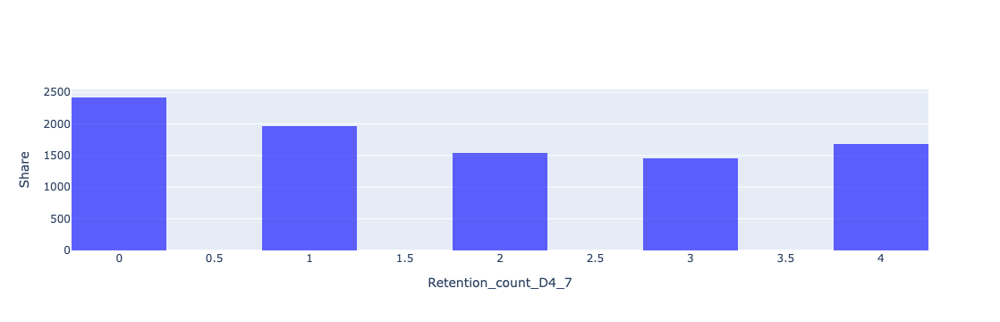

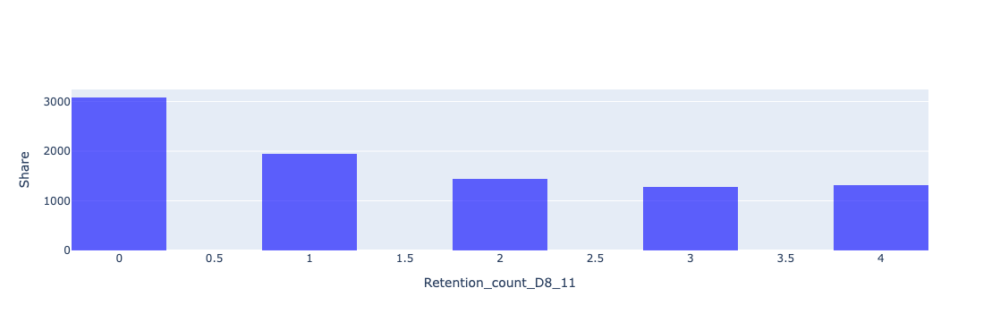

...

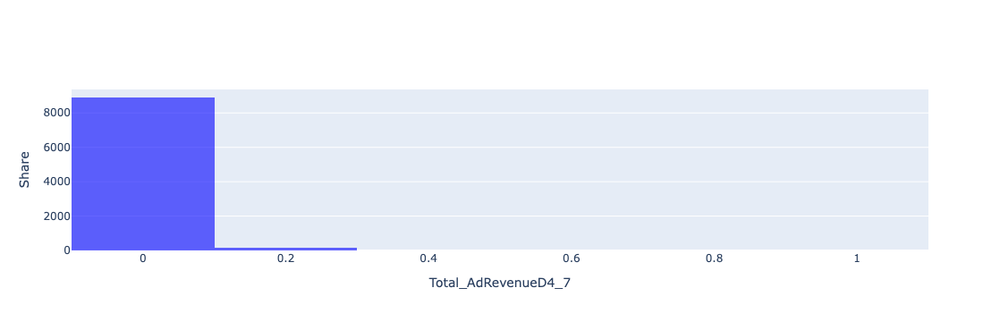

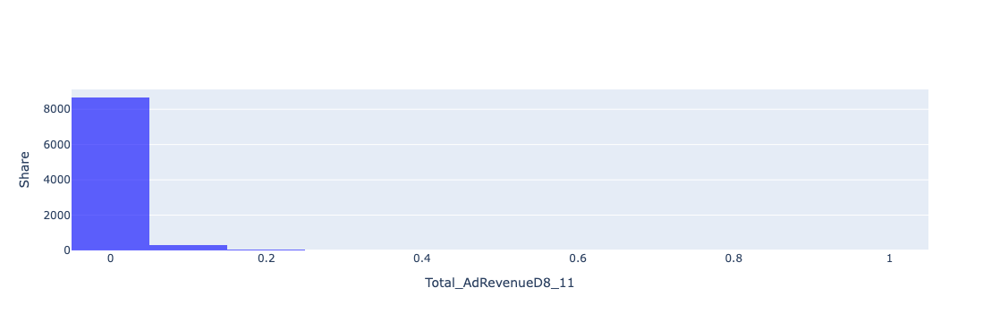

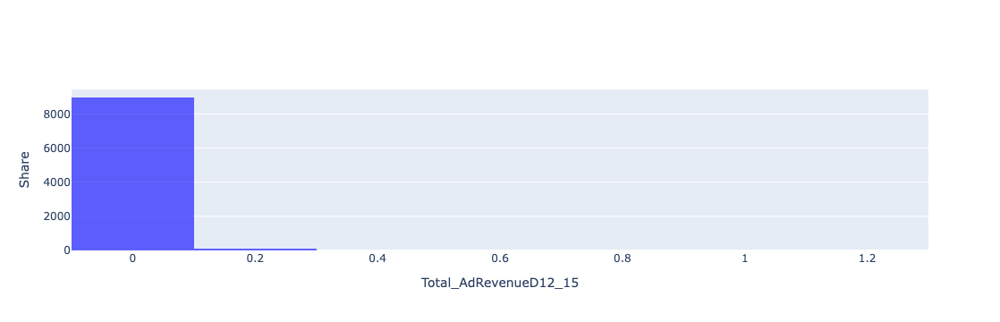

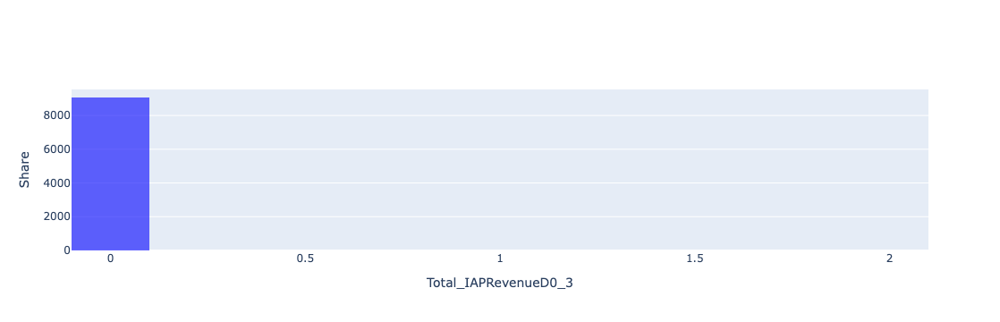

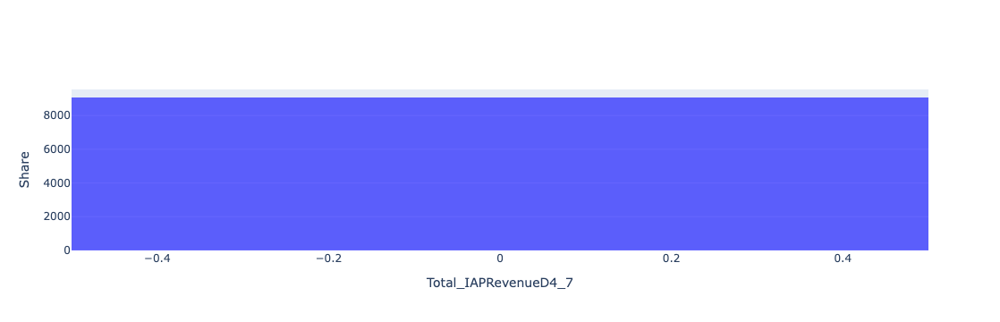

In [14]:
for feature in X_cols:

    fig = go.Figure()
    fig.add_trace(go.Histogram(x = df_poor_reg[feature],
                 marker_color = 'blue', opacity = 0.6, nbinsx = 10))


    fig.update_layout(
        legend = dict(
        orientation="h",
        yanchor="bottom",
        y=1.02,
        xanchor="right",
        x=1
        ),
        xaxis_title = feature,
        yaxis_title = "Share"
    )
    fig.show()

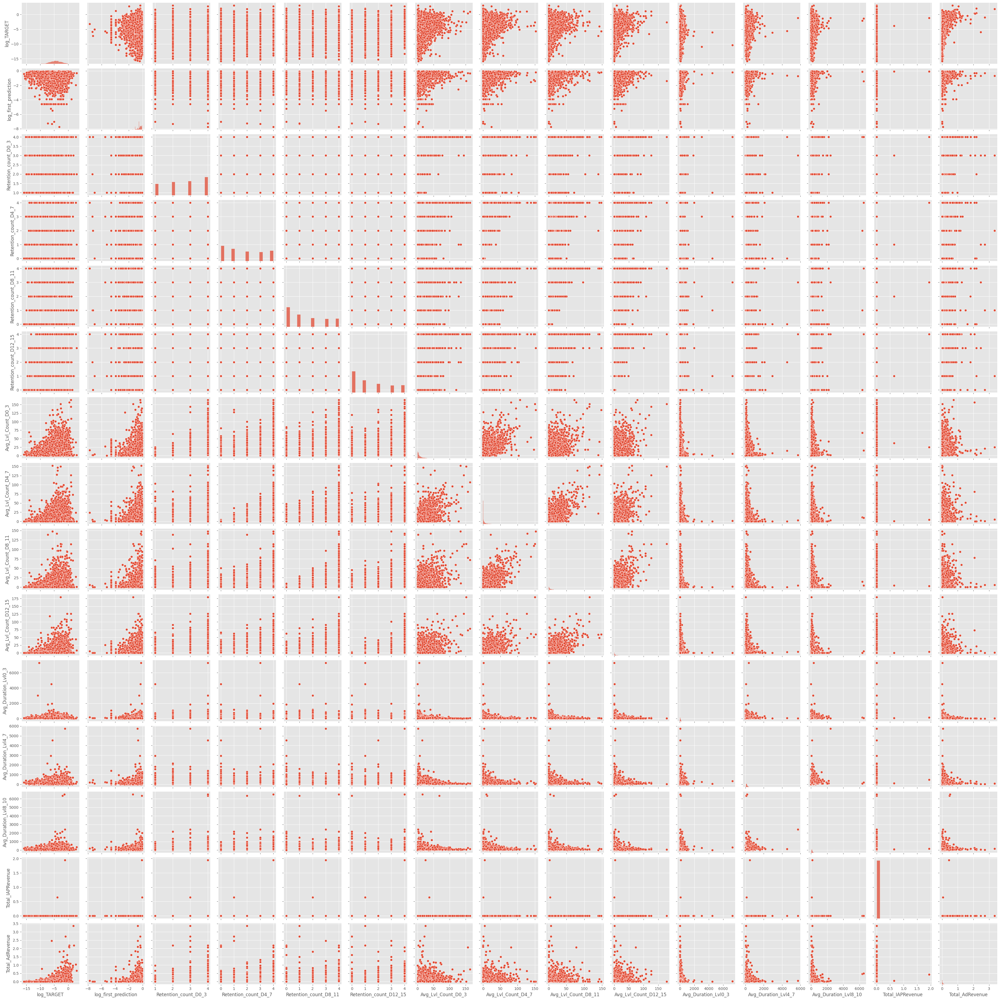

In [15]:
sns.pairplot(df_poor_reg.loc[:,['log_TARGET', 
                                'log_first_prediction',
                    'Retention_count_D0_3', 'Retention_count_D4_7', 'Retention_count_D8_11', 'Retention_count_D12_15',
                      'Avg_Lvl_Count_D0_3', 'Avg_Lvl_Count_D4_7', 'Avg_Lvl_Count_D8_11', 'Avg_Lvl_Count_D12_15',
                     'Avg_Duration_Lvl0_3',	'Avg_Duration_Lvl4_7',	'Avg_Duration_Lvl8_10',
                       'Total_IAPRevenue', 'Total_AdRevenue']])

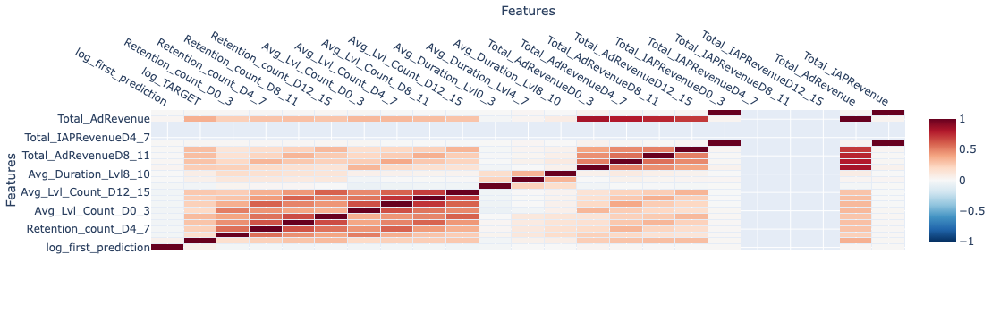

In [16]:
correlation_matrix = df_poor_reg[X_cols].corr()

fig = go.Figure(data=go.Heatmap(
                   z = correlation_matrix,
                   x = correlation_matrix.columns,
                   y = correlation_matrix.index,
                   hoverongaps = False,
                   xgap = 1,
                   ygap = 1,
                   zmin = -1,
                   zmax = 1,
    colorscale = 'rdbu_r'
))

fig.update_xaxes(side="top")
fig.update_layout(xaxis_title = "Features", yaxis_title = "Features")
fig.show()

**Model**

In [17]:
X_cols = ['log_first_prediction',
          'Retention_count_D0_3', 'Retention_count_D4_7', 'Retention_count_D8_11', 'Retention_count_D12_15',
          'Avg_Lvl_Count_D0_3', 'Avg_Lvl_Count_D4_7', 'Avg_Lvl_Count_D8_11', 'Avg_Lvl_Count_D12_15',
          'Avg_Duration_Lvl0_3',	'Avg_Duration_Lvl4_7',	'Avg_Duration_Lvl8_10',
          'Total_IAPRevenue', 'Total_AdRevenue']

In [18]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error

In [19]:
model = RandomForestRegressor(n_estimators=100, random_state=42)

In [20]:
scaler = MinMaxScaler()
X = pd.DataFrame(scaler.fit_transform(df_poor_reg[X_cols]), columns=df_poor_reg[X_cols].columns)

In [21]:
X_train, X_test, y_train, y_test = train_test_split(X, df_poor_reg.log_TARGET, test_size=0.2, random_state=42)

In [22]:
model.fit(X_train, y_train)

train_predictions = model.predict(X_train)
test_predictions = model.predict(X_test)

rmse_test = np.sqrt(mean_squared_error(y_test, test_predictions))
rmse_train = np.sqrt(mean_squared_error(y_train, train_predictions))

In [23]:
print(rmse_test)
print(rmse_train)

2.0704906662169438
0.7557634548060155


In [26]:
importances = model.feature_importances_

feature_importance_df = pd.DataFrame({'Feature': X.columns, 'Importance': importances})
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

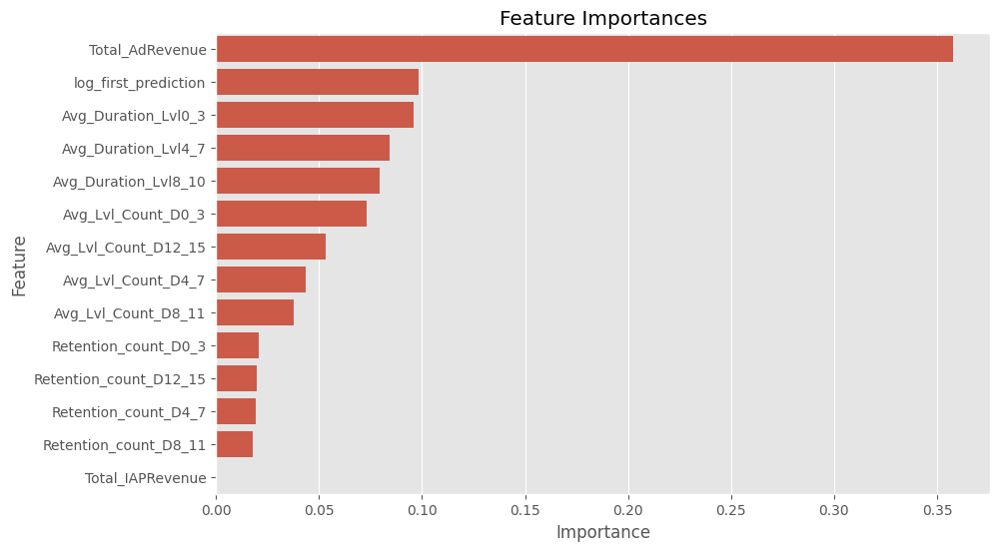

In [27]:
plt.figure(figsize=(10, 6))
sns.barplot(x='Importance', y='Feature', data=feature_importance_df)
plt.title('Feature Importances')
plt.show()

In [28]:
with open('../../../models/poor_regressor.pkl', 'wb') as file:
    pickle.dump(model, file)